# <center> **Making and Preprocessing Datasets for regression** </center> 

In [2]:
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.compose import ColumnTransformer

from pickle import dump, load
import gzip

import numpy as np
import pandas as pd

from matplotlib import pyplot as plt
import seaborn as sns

import re

___

In [3]:
RANDSEED = 42

In [137]:
plt.rcParams.update({'figure.figsize': [15.0, 10.0],
                     'figure.dpi' : 300,
                     'font.size': 18.0, 
                     'mathtext.fontset' : 'stix', 
                     'font.family' : 'STIXGeneral'
                    })

___
# Preprocessing function

- scales numerical input features to have zero mean and unit variance
- encodes categorical input features to dummy variables
- scales output features to be in the [0,1] range (additionally can make them uniformly distributed)

In [53]:
def preprocess(dataset, y_label, numerical_cols, categorical_cols, test_size = 0.2, val_size=0.2, makeYuniform = False):
    
    #### Get output values
    X = dataset.copy(deep=True)
    y = pd.DataFrame(X.pop(y_label))

    
    #### Split (train+val) - (test)
    X, X_test, y, y_test = train_test_split(X, y, test_size=test_size, random_state=RANDSEED)
    
    
    #### Preprocessing input values
    preprocessorX = ColumnTransformer(
        transformers=[
            ('num', preprocessing.StandardScaler(), numerical_cols), #scale numerical values to: (mean, std) = (0, 1)
            ('cat', preprocessing.OneHotEncoder(), categorical_cols) #one hot encoding for categorical values: (1, 2, 3) = [(1,0,0), (0,1,0), (0,0,1)]
        ])
    X = preprocessorX.fit_transform(X)
    X_test = preprocessorX.transform(X_test)

    
    #### Preprocessing output values
    if makeYuniform == False:
        preprocessorY = preprocessing.MinMaxScaler() #scale output values to be in range [0,1]
    else:
        preprocessorY = preprocessing.QuantileTransformer() #make output distribution uniform over [0,1]
        
    y = preprocessorY.fit_transform(y)
    y_test = preprocessorY.transform(y_test)

    
    #### Split train-validation
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=val_size/(1-test_size), random_state=RANDSEED)

    
    return [X_train, np.array(y_train)[:,0], X_val, np.array(y_val)[:,0], X_test, np.array(y_test)[:,0]]

___
# Test Dataset

In [120]:
def SampleFunction(X, featureNumber=0, case=None):
    x = X[:,featureNumber]
    
    if case == "waves":
        y = 6 * np.sin(x) + 0.1 * x ** 2 - x * np.sin(3*x)
    elif case == "sin":
        y = np.sin(2.5*x/np.pi)
    elif case == "exp":
        y = 1.2 ** x 
    elif case == "gauss":
        y = 2 ** (- 0.5 * x ** 2)
    elif case == "const":
        y = 1
    
    else:
        raise NotImplementedError(f"No function implemented for case {case}")

    return y 

def SampleFunction_nDim(X, dims=1, function_cases=[0]):
    if len(function_cases) != dims:
        raise ValueError ("Length Mismatch: must add a function case for each dim")
    y = 1
    for i in range(dims):
        y *= SampleFunction(X, featureNumber=i, case=function_cases[i])
    return y

## 1-dim

In [130]:
minX = -5
maxX = 5
functions = ["waves"]
nPoints = 50000


X = np.random.random((nPoints,1))*(maxX-minX) + minX
y = SampleFunction_nDim(X, 1, function_cases=functions)

data = pd.DataFrame(zip(y,*np.transpose(X)), columns=["y","x"])
display(data)

DATASET = tuple(preprocess(data, "y", ["x"], [])+ [(1,)])
#dump(DATASET, gzip.open(f"DatasetsProcessed/testDataset_1dim", "wb"))

,y,x
0,-4.967626,-0.878633
1,-7.558755,4.908512
2,0.624925,3.041478
3,0.938768,3.129587
4,7.950999,-4.059240
...,...,...
49995,2.002642,2.483465
49996,-7.639428,4.899829
49997,-0.728808,-0.115418
49998,0.644740,0.113841


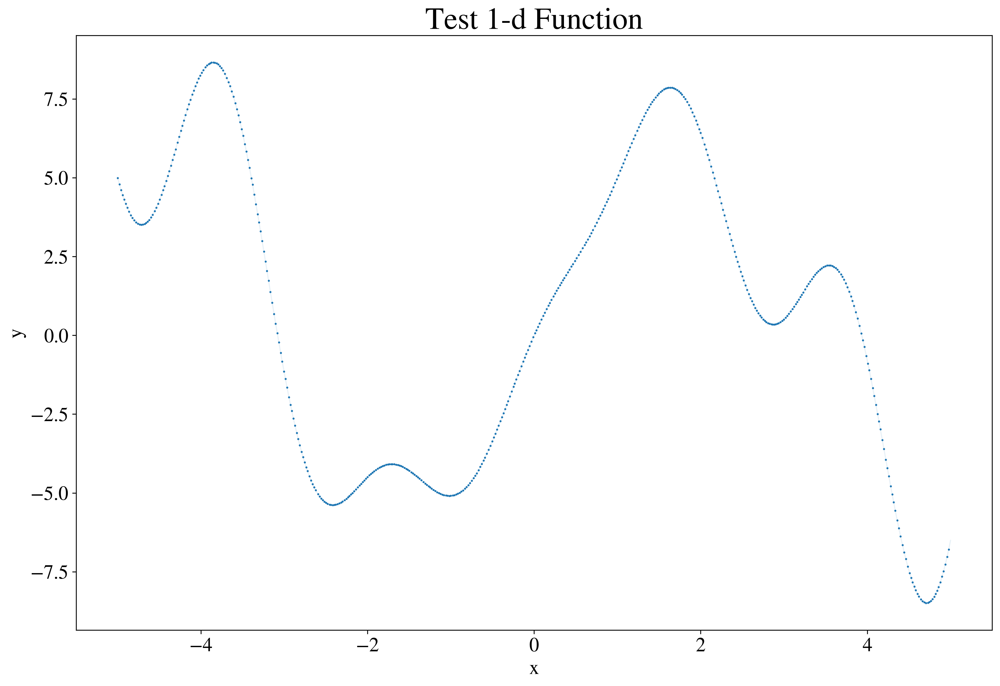

In [139]:
data = data.sort_values("x")
plt.scatter(data=data[::100], x="x", y="y", marker='.',s=3)
plt.plot(data["x"], data["y"], alpha=0.1, lw=1)
plt.title("Test 1-d Function", size=28)
plt.xlabel("x")
plt.ylabel("y")
#plt.savefig(f"Figures/Datasets/Test/1d_function.pdf", format="pdf", pad_inches=0)

## 2-dim

In [384]:
minX = -5
maxX = 5
functions = ["sin", "exp"]
nPoints = 50000


X = np.random.random((nPoints,2))*(maxX-minX) + minX
y = SampleFunction_nDim(X, 2, function_cases=functions)

cols = [f"x_{i}" for i in range(2)]

data = pd.DataFrame(zip(y,*np.transpose(X)), columns=["y",*cols])
display(data)

DATASET = tuple(preprocess(data, "y", [*cols], [])+ [(2,)])
#dump(DATASET, gzip.open(f"DatasetsProcessed/testDataset_2dim", "wb"))

,y,x_0,x_1
0,-0.383674,-0.310864,2.463222
1,1.254912,1.817927,1.287779
2,-0.434763,-1.193658,-3.435450
3,-0.066086,-0.152200,-3.309301
4,-2.222898,-1.748826,4.469802
...,...,...,...
49995,0.242837,0.678236,-4.111607
49996,0.940317,1.589852,-0.077265
49997,-0.730153,-1.686727,-1.580475
49998,-0.581633,-2.586272,-2.293582


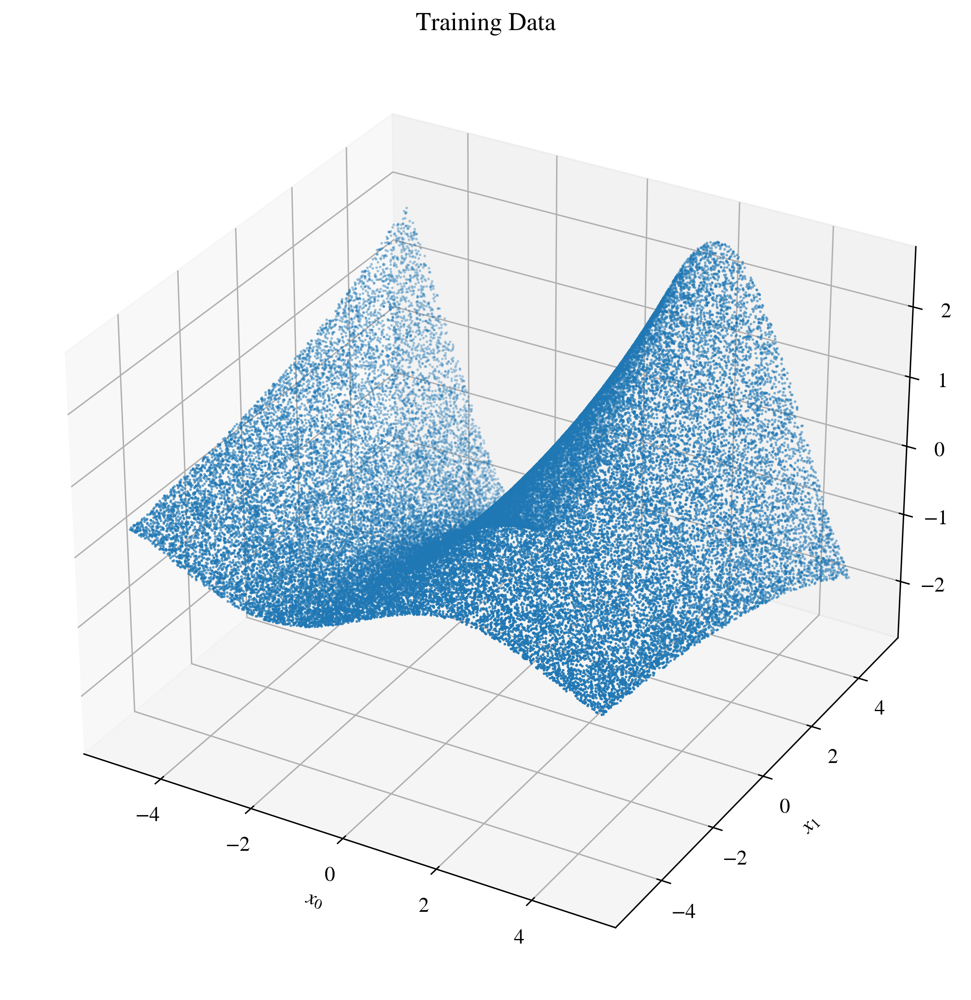

In [385]:
fig = plt.figure()
ax = fig.add_subplot(projection="3d")
ax.scatter(X[:,0], X[:,1], y, s=1, marker='.')
ax.set_xlabel(r"$x_0$")
ax.set_ylabel(r"$x_1$")
ax.set_zlabel("y")
plt.title("Training Data");

___
# California Housing Dataset

In [192]:
####     Load California housing dataset     ####
data = pd.read_csv("DatasetsRaw/housing.csv").dropna()

#Remove "ocean_proximity" == "ISLAND" (only 5 entries, not relevant)
data = data[data["ocean_proximity"] != "ISLAND"]

#Rename Columns for Plotting
data = data[["median_house_value",'longitude', 'latitude', 'housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households', 'median_income', 'ocean_proximity']]
data.columns=["Median House Value",'Longitude', 'Latitude', 'Median House Age', 'Total Rooms', 'Total Bedrooms', 'Population', 'Households', 'Median Income', 'Ocean Proximity']

display(data)

#Preprocessing
numerical_cols = ['Longitude', 'Latitude', 'Median House Age', 'Total Rooms', 'Total Bedrooms', 'Population', 'Households', 'Median Income']
categorical_cols = ['Ocean Proximity']

#### House value is capped at 500001, optionally delete entries with value = 500001 (~ 5% of data)
#data = data[ data['Median House Value'] != 500001]

#### Feature Engineering (doesn't change much)
#data['Rooms per House'] = data['Total Rooms'] / data['Households']; numerical_cols +=['Rooms per House'];
#data['Bedrooms per House'] = data['Total Bedrooms'] / data['Households']; numerical_cols +=['Bedrooms per House'];
#data['Persons per House'] = data['Population'] / data['Households']; numerical_cols +=['Persons per House'];



X_train, y_train, X_val, y_val, X_test, y_test = preprocess(data, "Median House Value", numerical_cols, categorical_cols)
INPUT_SHAPE = (X_train.shape[1],)

#### Dump processed dataset
DATASET = (X_train, y_train, X_val, y_val, X_test, y_test, INPUT_SHAPE)
#dump(DATASET, gzip.open("DatasetsProcessed/housing", "wb"))

,Median House Value,Longitude,Latitude,Median House Age,Total Rooms,Total Bedrooms,Population,Households,Median Income,Ocean Proximity
0,452600.0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,NEAR BAY
1,358500.0,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,NEAR BAY
2,352100.0,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,NEAR BAY
3,341300.0,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,NEAR BAY
4,342200.0,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20635,78100.0,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,INLAND
20636,77100.0,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,INLAND
20637,92300.0,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,INLAND
20638,84700.0,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,INLAND


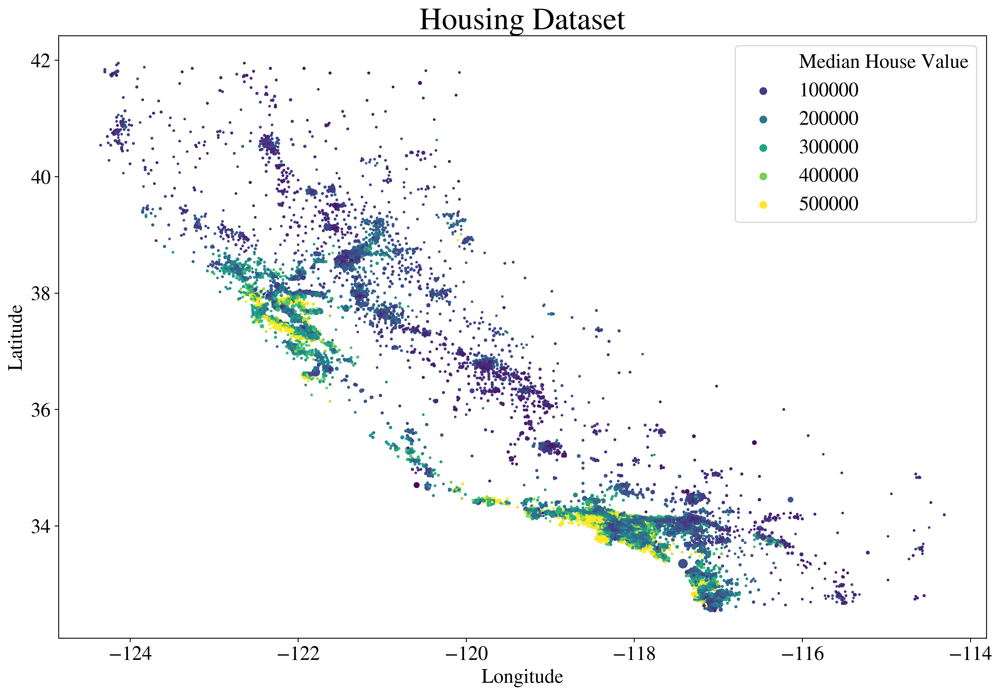

In [159]:
# Data Visualization
fig = plt.figure()
plt.title("Housing Dataset", size=28)
sns.scatterplot(data=data, x="Longitude", y="Latitude", size="Population", sizes=(5,75), hue="Median House Value", palette="viridis", linewidth=0);
h,l = plt.gca().get_legend_handles_labels()
plt.gca().legend(h[0:6], l[0:6])
plt.show()
#fig.savefig(f"Figures/Datasets/Housing/dataset_overview_map.pdf", format="pdf", pad_inches=0)

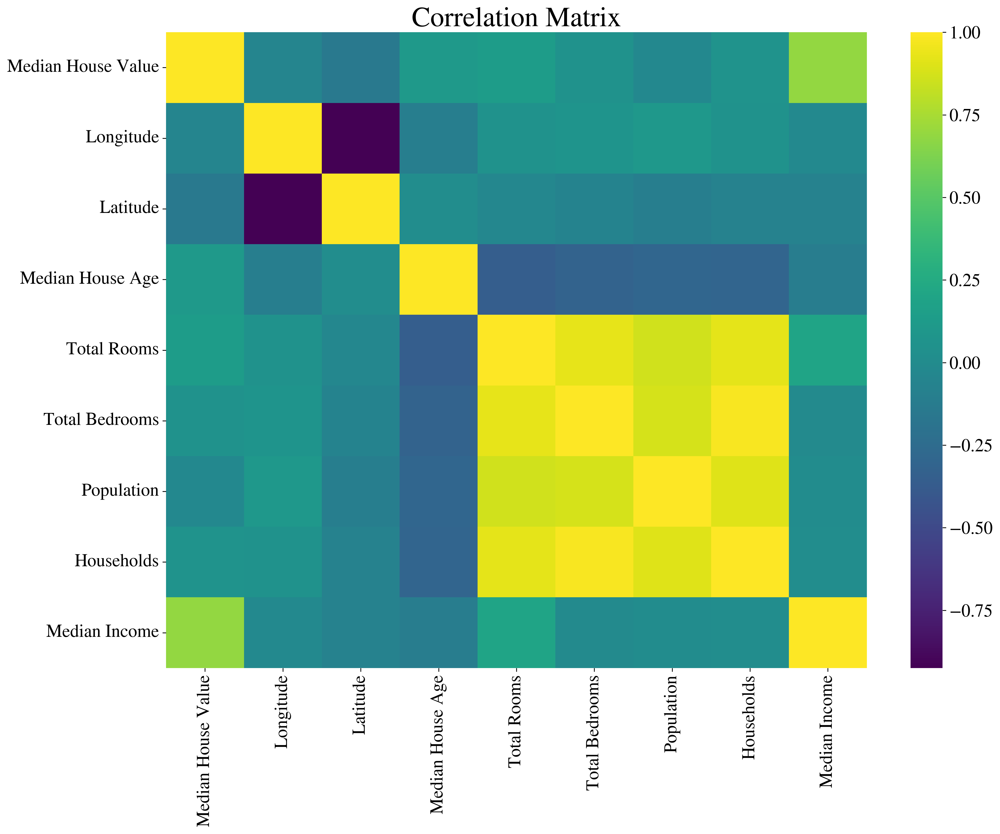

In [168]:
fig = plt.figure(figsize=(15,12))
plt.title("Correlation Matrix", fontsize=28)
ax = plt.gca()
sns.heatmap(data.corr(), cmap="viridis", ax=ax)
plt.tight_layout()
plt.show()
#fig.savefig(f"Figures/Datasets/Housing/correlations.pdf", format="pdf")

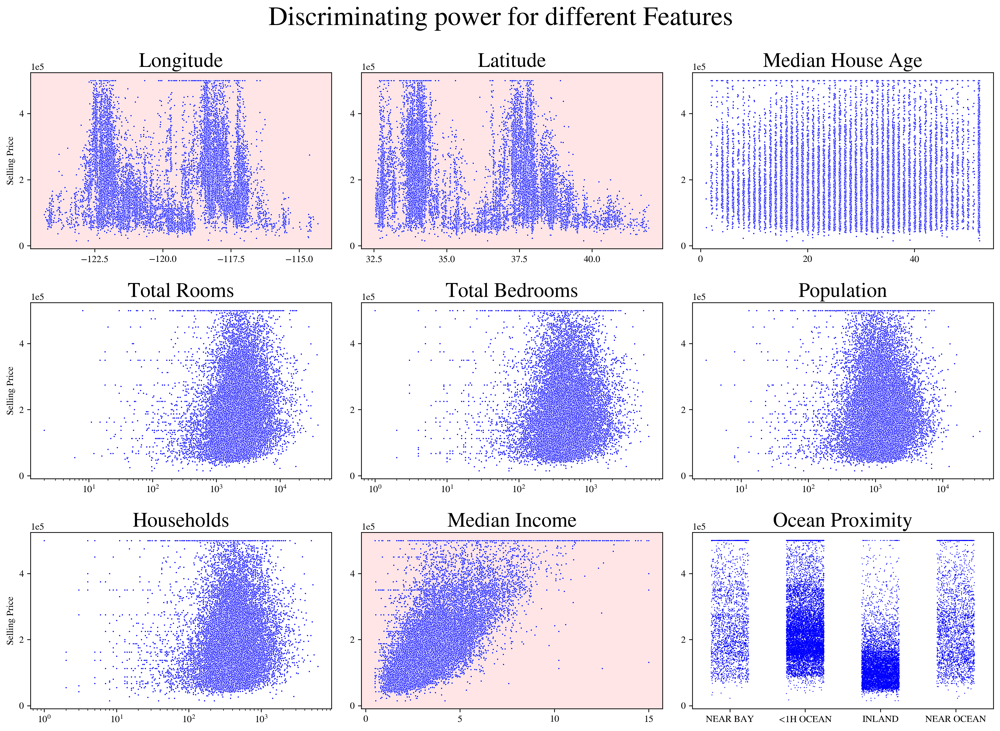

In [197]:
nFeat = len(data.columns)-1
fig, axs = plt.subplots((nFeat+2)//3,3, figsize=(15,3*(nFeat+2)//3))
fig.suptitle("Discriminating power for different Features", fontsize=28)

discrete = ["Ocean Proximity"]

for i, col in enumerate(data.columns.drop(["Median House Value"])):
    ax = axs[i//3, i%3]
    ax.ticklabel_format(axis='y', scilimits=[-5,5])
    for item in ([ax.xaxis.label, ax.yaxis.label, ax.yaxis.get_offset_text()] + ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(10)
    if col in discrete:
        sns.stripplot(data=data,  x=col, y="Median House Value",jitter=0.25, ax=ax, marker='.', color="blue", s=2)
    elif col == "Median House Age":
        sns.scatterplot(x=data[col]+0.3*np.random.sample(len(data))-0.1, y=data["Median House Value"], marker='.', color="blue", s=10, ax=ax)
    else:
        sns.scatterplot(data=data, x=col, y="Median House Value", marker='.',color="blue", s=10, ax=ax)
    ax.set_title(col)
    ax.set_xlabel("")
    if i%3==0:
        ax.set_ylabel("Selling Price")
    else:
        ax.set_ylabel("")
    #ax.set_yscale("log")
    if col in ["Population", "Households", "Total Rooms", "Total Bedrooms"]:
        ax.set_xscale("log")
    if col in ["Longitude", "Latitude", "Median Income"]:
        ax.set_facecolor((1,0,0,0.1))
        
for i in range(nFeat, (nFeat+2)//3*3):
    axs[i//3, i%3].axis("off")
    
fig.tight_layout()
#fig.savefig(f"Figures/Datasets/Housing/feature_selection.pdf", format="pdf")
plt.show()

### California housing  (less features)

#### Only a few features seem to be essential:
- coordinates (discriminating from scatterplots)
- median income (discriminating, high correlation with target value)

In [56]:
numerical_cols = ['Longitude', 'Latitude', 'Median Income']
categorical_cols = []

X_train, y_train, X_val, y_val, X_test, y_test = preprocess(data, "Median House Value", numerical_cols, categorical_cols)
INPUT_SHAPE = (X_train.shape[1],)

#### Dump processed dataset
DATASET = (X_train, y_train, X_val, y_val, X_test, y_test, INPUT_SHAPE)
#dump(DATASET, gzip.open("DatasetsProcessed/housing_lessFeatures", "wb"))

___
# Car Price Dataset 1

In [199]:
data = pd.read_csv("DatasetsRaw/car_v3.csv").dropna()

#remove CNG and LPG fuel types (only 87 entries, not relevant)
data = data[(data["fuel"] != "LPG") & (data["fuel"] != "CNG")]

#remove names
data.drop(columns=["name"], inplace=True)

#remove units, convert to numbers
data["engine"] = data["engine"].map(lambda x: int(x.split(" ")[0]))
data["max_power"] = data["max_power"].map(lambda x: float(x.split(" ")[0]))
data["mileage"] = data["mileage"].map(lambda x: float(x.split(" ")[0]))

#format torque
data["torque"] = data["torque"].map(lambda x: float(re.search("^\d+\.?\d{0,2}(?=\D)", x)[0]) if (re.search("(kgm)|(KGM)", x) == None) else 9.8 * float(re.search("^\d+\.?\d{0,2}(?=\D)", x)[0]))
data["torque"] = data["torque"].map(lambda x: x if x < 7e2 else x/9.8)

#convert number of owners to value
data = data[data["owner"] != "Test Drive Car" ] #only 5 entries, not relevant
convOwner = {"First Owner" : 1, "Second Owner" : 2, "Third Owner" : 3, "Fourth & Above Owner" : 4}
data["owner"] = data["owner"].map(lambda x: convOwner[x])


#Rename columns for plotting
data.columns = ["Year", "Selling Price", "Mileage [km]", "Fuel", "Seller Type", "Transmission", "Num of Previous Owners", "Fuel Consumption [km/L]", "Engine Size [cc]", "Max Power [bhp]", "Max Torque [Nm]", "Seats"]
data = data[["Selling Price", "Year", "Mileage [km]", "Fuel", "Seller Type", "Transmission", "Num of Previous Owners", "Fuel Consumption [km/L]", "Engine Size [cc]", "Max Power [bhp]", "Max Torque [Nm]", "Seats"]]

#Remove outliers ~3% of data
threshold = data["Selling Price"].mean() + 3 * data["Selling Price"].std()
data = data[data["Selling Price"]<threshold]


display(data)

#Preparing dataset with preprocessing steps
numerical_cols = ["Year", "Mileage [km]", "Num of Previous Owners", "Fuel Consumption [km/L]", "Engine Size [cc]", "Max Power [bhp]", "Max Torque [Nm]", "Seats"]
categorical_cols = ["Fuel", "Seller Type", "Transmission"]                  
                  
X_train, y_train, X_val, y_val, X_test, y_test = preprocess(data, "Selling Price", numerical_cols, categorical_cols, makeYuniform=False)
INPUT_SHAPE = (X_train.shape[1],)


#### Dump processed dataset
DATASET = (X_train, y_train, X_val, y_val, X_test, y_test, INPUT_SHAPE)
dump(DATASET, gzip.open("DatasetsProcessed/cars_v3", "wb"))

,Selling Price,Year,Mileage [km],Fuel,Seller Type,Transmission,Num of Previous Owners,Fuel Consumption [km/L],Engine Size [cc],Max Power [bhp],Max Torque [Nm],Seats
0,450000,2014,145500,Diesel,Individual,Manual,1,23.40,1248,74.00,190.00,5.0
1,370000,2014,120000,Diesel,Individual,Manual,2,21.14,1498,103.52,250.00,5.0
2,158000,2006,140000,Petrol,Individual,Manual,3,17.70,1497,78.00,124.46,5.0
3,225000,2010,127000,Diesel,Individual,Manual,1,23.00,1396,90.00,219.52,5.0
4,130000,2007,120000,Petrol,Individual,Manual,1,16.10,1298,88.20,112.70,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
8123,320000,2013,110000,Petrol,Individual,Manual,1,18.50,1197,82.85,113.70,5.0
8124,135000,2007,119000,Diesel,Individual,Manual,4,16.80,1493,110.00,235.20,5.0
8125,382000,2009,120000,Diesel,Individual,Manual,1,19.30,1248,73.90,190.00,5.0
8126,290000,2013,25000,Diesel,Individual,Manual,1,23.57,1396,70.00,140.00,5.0


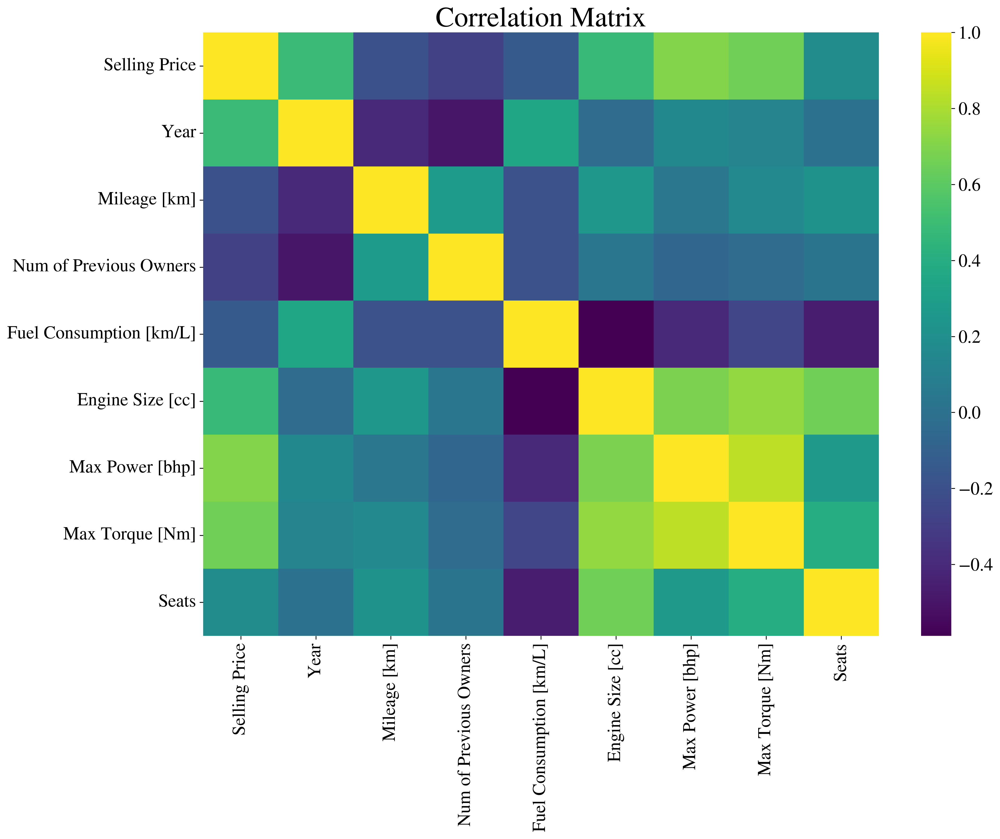

In [181]:
fig = plt.figure(figsize=(15,12))
plt.title("Correlation Matrix", fontsize=28)
ax = plt.gca()
sns.heatmap(data.corr(), cmap="viridis", ax=ax)
plt.tight_layout()
plt.show()
#fig.savefig(f"Figures/Datasets/Cars/correlations.pdf", format="pdf")

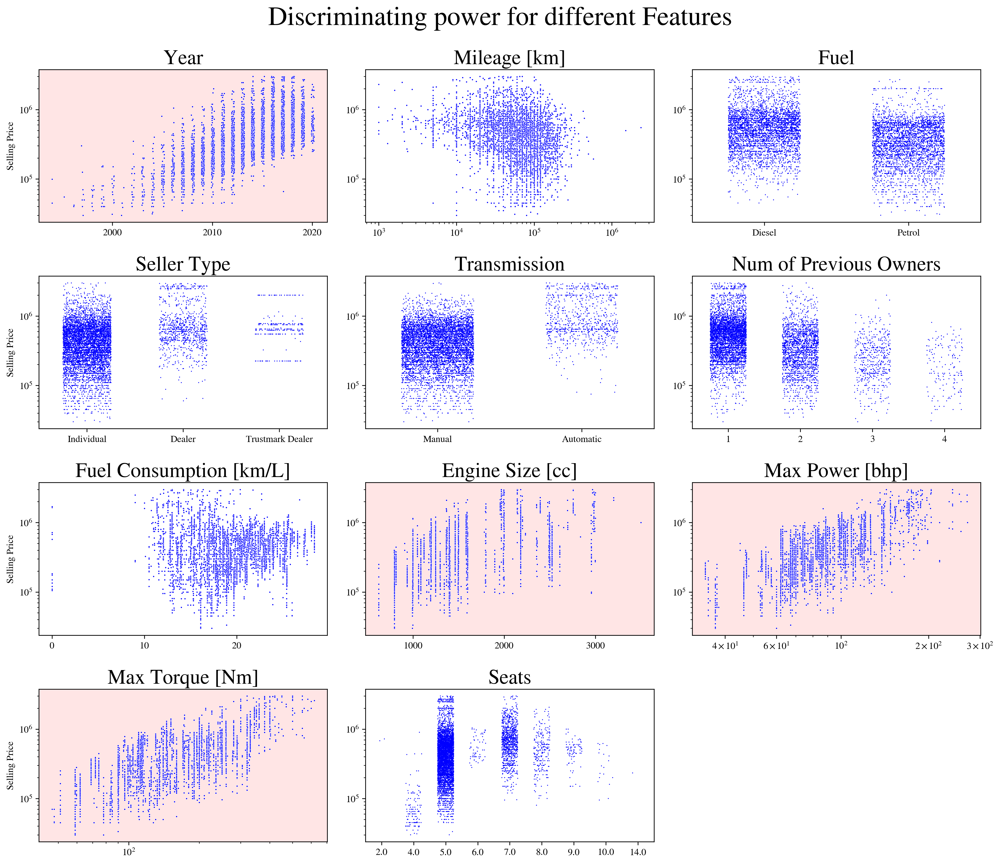

In [215]:
nFeat = len(data.columns)-1
fig, axs = plt.subplots((nFeat+2)//3,3, figsize=(15,3*(nFeat+2)//3))
fig.suptitle("Discriminating power for different Features", fontsize=28)

discrete = ["Fuel", "Seller Type", "Transmission", "Num of Previous Owners", "Seats"]

for i, col in enumerate(data.columns.drop(["Selling Price"])):
    ax = axs[i//3, i%3]
    if col in discrete:
        sns.stripplot(data=data,  x=col, y="Selling Price",jitter=0.25, ax=ax, marker='.', color="blue", s=2)
    elif col == "Year":
        sns.scatterplot(x=data["Year"]+0.3*np.random.sample(len(data))-0.1, y=data["Selling Price"], marker='.', color="blue", s=10, ax=ax)
    else:
        sns.scatterplot(data=data, x=col, y="Selling Price", marker='.',color="blue", s=10, ax=ax)
    ax.set_title(col)
    ax.set_xlabel("")
    if i%3==0:
        ax.set_ylabel("Selling Price")
    else:
        ax.set_ylabel("")
    
    if col in ["Mileage [km]", "Max Power [bhp]", "Max Torque [Nm]"]:
        ax.set_xscale("log")
    if col in ["Year", "Max Power [bhp]", "Engine Size [cc]", "Max Torque [Nm]"]:
        ax.set_facecolor((1,0,0,0.1))
    
    ax.set_yscale("log")
    for item in ([ax.xaxis.label, ax.yaxis.label, ax.yaxis.get_offset_text()] + ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(10)
    
    if col == "Max Power [bhp]":
        ax.set_xticks([4e1,6e1,1e2,2e2,3e2])

for i in range(nFeat, (nFeat+2)//3*3):
    axs[i//3, i%3].axis("off")
    
fig.tight_layout()
#fig.savefig(f"Figures/Datasets/Cars/feature_selection.pdf", format="pdf")

## Cars (less features)

#### Only a few features seem to be highly predictive:
- Selling Year
- Engine Size, Max Power and Max Torque $\rightarrow$ they are strongly correlated, thus only keeping Power

In [99]:
numerical_cols = ['Year', "Max Power [bhp]"]
categorical_cols = []

X_train, y_train, X_val, y_val, X_test, y_test = preprocess(data, "Selling Price", numerical_cols, categorical_cols, makeYuniform=False)
INPUT_SHAPE = (X_train.shape[1],)

#### Dump processed dataset
DATASET = (X_train, y_train, X_val, y_val, X_test, y_test, INPUT_SHAPE)
dump(DATASET, gzip.open("DatasetsProcessed/cars_v3_lessFeatures", "wb"))

___
# Mauna Loa CO2

In [217]:
data = pd.read_csv("DatasetsRaw/co2_mlo.txt", sep='\s+', usecols=["year", "month", "time_decimal", "value", "value_std_dev"], na_values=[-999.99, -99.99]).dropna()
data.columns=["Year", "Month", "Time Decimal", "Value", "Value STD"]
display(data)


numerical_cols = ['Year', "Month"]
categorical_cols = []

X_train, y_train, X_val, y_val, X_test, y_test = preprocess(data, "Value", numerical_cols, categorical_cols, makeYuniform=False)
INPUT_SHAPE = (X_train.shape[1],)

DATASET = (X_train, y_train, X_val, y_val, X_test, y_test, INPUT_SHAPE)
dump(DATASET, gzip.open("DatasetsProcessed/co2_mlo_2var", "wb"))

numerical_cols = ['Time Decimal']
X_train, y_train, X_val, y_val, X_test, y_test = preprocess(data, "Value", numerical_cols, categorical_cols, makeYuniform=False)
INPUT_SHAPE = (X_train.shape[1],)

DATASET = (X_train, y_train, X_val, y_val, X_test, y_test, INPUT_SHAPE)
dump(DATASET, gzip.open("DatasetsProcessed/co2_mlo_1var", "wb"))

,Year,Month,Time Decimal,Value,Value STD
9,1974,5,1974.328767,333.16,0.36
10,1974,6,1974.413699,332.17,0.41
11,1974,7,1974.495890,331.11,0.49
12,1974,8,1974.580822,329.11,0.64
13,1974,9,1974.665753,327.30,0.64
...,...,...,...,...,...
587,2022,7,2022.495890,418.85,1.02
588,2022,8,2022.580822,417.18,0.68
589,2022,9,2022.665753,415.89,0.58
590,2022,10,2022.747945,415.72,0.48


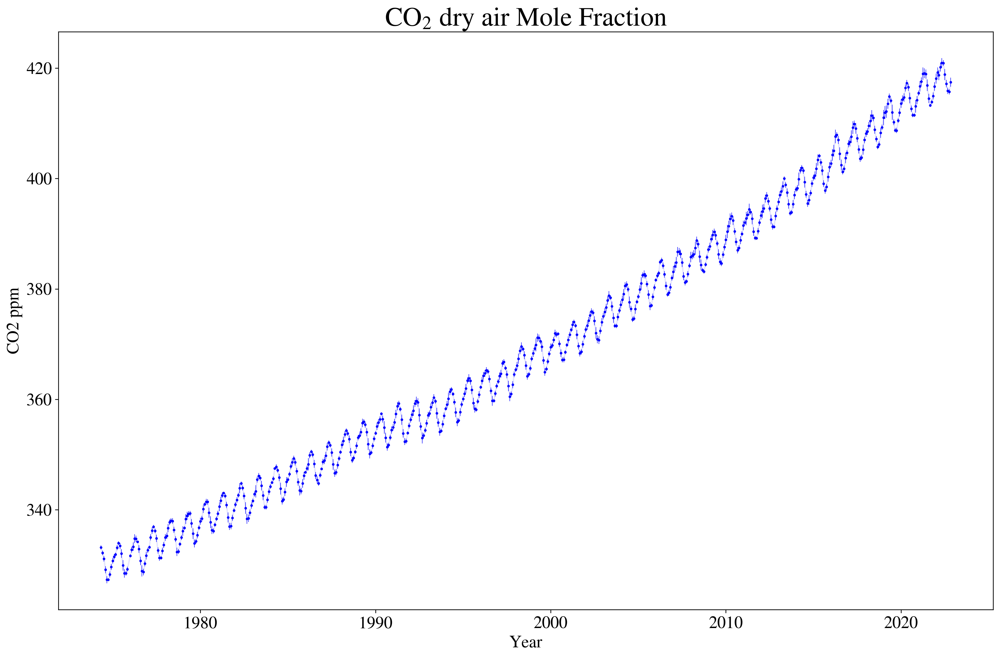

In [220]:
plt.scatter(x=data["Time Decimal"], y=data["Value"], color="blue", s=3)
plt.errorbar(x=data["Time Decimal"], y=data["Value"], yerr=data["Value STD"], fmt="None", elinewidth=0.5, color="blue")
plt.plot(data["Time Decimal"], data["Value"], color="blue", alpha=0.1)
plt.xlabel("Year")
plt.ylabel("CO2 ppm")
plt.title("CO${}_2$ dry air Mole Fraction", fontsize=28);
plt.tight_layout()
#plt.savefig(f"Figures/Datasets/CO2/data.pdf", format="pdf")

___